In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

In [ ]:
!pip install shap lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 18.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 36.5 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=f3723ca48a8abc32d5dbaf436e5297111fd28f4234e03ec0cde87512787c6316
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# Load dataset
url = 'https://storage.googleapis.com/download.tensorflow.org/data/creditcard.csv'
data = pd.read_csv(url)

In [ ]:
# Dataset Description
num_rows = data.shape[0]
num_columns = data.shape[1]
column_names = data.columns.tolist()
variable_types = data.dtypes.value_counts().to_dict()
target_variable = 'Class'
target_distribution = data['Class'].value_counts(normalize=True).to_dict()
# Initial Insights
summary_statistics = data.describe()
missing_values = data.isnull().sum()
dataset_summary = {
    'Number of Rows': num_rows,
    'Number of Columns': num_columns,
    'Column Names': column_names,
    'Variable Types': variable_types,
    'Target Variable': target_variable,
    'Target Variable Distribution': target_distribution,
    'Summary Statistics': summary_statistics,
    'Missing Values': missing_values
}
print(dataset_summary)

{'Number of Rows': 284807, 'Number of Columns': 31, 'Column Names': ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class'], 'Variable Types': {dtype('float64'): 30, dtype('int64'): 1}, 'Target Variable': 'Class', 'Target Variable Distribution': {0: 0.9982725143693799, 1: 0.001727485630620034}, 'Summary Statistics':                 Time            V1            V2            V3            V4  \
count  284807.000000  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean    94813.859575  1.168375e-15  3.416908e-16 -1.379537e-15  2.074095e-15   
std     47488.145955  1.958696e+00  1.651309e+00  1.516255e+00  1.415869e+00   
min         0.000000 -5.640751e+01 -7.271573e+01 -4.832559e+01 -5.683171e+00   
25%     54201.500000 -9.203734e-01 -5.985499e-01 -8.903648e-01 -8.486401e-01   
50%     84692.000000  1.810880e-02  6.54855

In [ ]:
# Check for missing values
print(data.isnull().sum())

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors
import sklearn
from tensorflow import keras
# Importing Plotly libraries
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot
from plotly.subplots import make_subplots
# Class distribution
labels = ['Not Fraud', 'Fraud']
sizes = [data.Class[data['Class'] == 0].count(), data.Class[data['Class'] == 1].count()]
# Plotly pie chart for the distribution of fraud and normal transactions
fig = px.pie(data, names="Class", title="Distribution of Fraud and Normal Transactions: (Normal:0 | Fraud:1)",
             color_discrete_sequence=['red', '#FFF'],
             template="plotly_dark", width=700, height=500)
fig.show()

Class distribution:
Class
0    284315
1       492
Name: count, dtype: int64


<ipython-input-10-30d719281b5b>:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




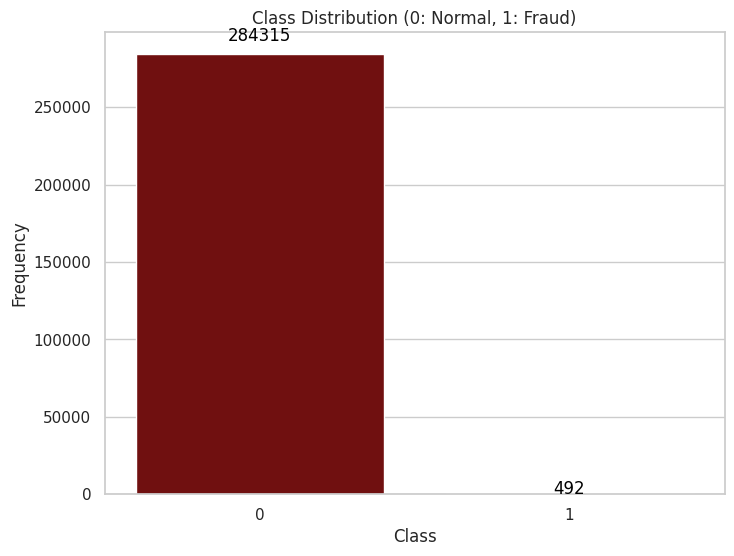

In [ ]:
class_counts = data['Class'].value_counts()
print("Class distribution:")
print(class_counts)

# Bar plot to visualize class distribution
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
bar_plot = sns.barplot(x=class_counts.index, y=class_counts.values, palette=['maroon', 'grey'])

# Add text annotations to display the values above the bars
for index, value in enumerate(class_counts.values):
    plt.text(index, value + 0.03 * value, str(value), color='black', ha="center", fontsize=12)

# Titles and labels
plt.title('Class Distribution (0: Normal, 1: Fraud)')
plt.xlabel('Class')
plt.ylabel('Frequency')

# Show plot
plt.show()


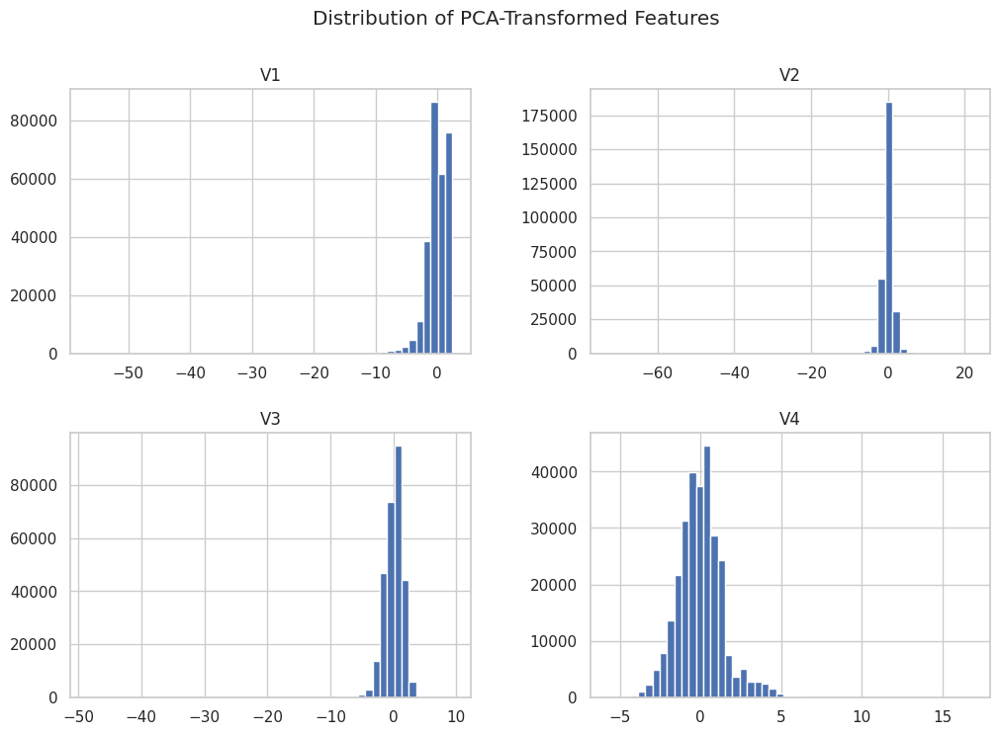

In [ ]:
# Visualize the distribution of features (Example: V1-V4)
data[['V1', 'V2', 'V3', 'V4']].hist(figsize=(12, 8), bins=50)
plt.suptitle('Distribution of PCA-Transformed Features')
plt.show()

In [ ]:
def find_outliers_iqr(df):
    outliers = {}
    for column in df.columns:
        if df[column].dtype in ['float64', 'int64']:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outlier_values = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
            if not outlier_values.empty:
                outliers[column] = outlier_values
    return outliers

outliers_iqr_values = find_outliers_iqr(data)
for column, values in outliers_iqr_values.items():
    print(f"Outliers in column ")
    print(values)

Outliers in column 
            Time         V1         V2        V3        V4        V5  \
18          14.0  -5.401258  -5.450148  1.186305  1.736239  3.049106   
85          55.0  -4.575093  -4.429184  3.402585  0.903915  3.002224   
140         87.0  -5.101877   1.897022 -3.458034 -1.277543 -5.517758   
146         92.0  -5.285971   4.847323 -1.290368 -1.427842 -0.621533   
164        103.0  -6.093248 -12.114213 -5.694973  3.294389 -1.413792   
...          ...        ...        ...       ...       ...       ...   
284631  172623.0  -5.459612   4.844512 -5.127471 -0.772816 -2.098147   
284649  172642.0 -11.946976   9.772660 -8.006237 -2.498596 -4.229520   
284772  172760.0  -6.713826   2.369104 -3.534768 -0.368259 -1.721030   
284795  172778.0 -12.516732  10.187818 -8.476671 -2.510473 -4.586669   
284802  172786.0 -11.881118  10.071785 -9.834783 -2.066656 -5.364473   

              V6        V7        V8        V9  ...       V21       V22  \
18     -1.763406 -1.559738  0.160842  1.

In [ ]:
# Initialize an empty set to collect unique outlier indices
all_outlier_indices = set()

# Convert the set back to a list to drop rows
all_outlier_indices = list(all_outlier_indices)
# Verify before dropping
print(f"Indices to be dropped: {all_outlier_indices}")
# Drop the rows using the identified valid outlier indices
df_no_outliers = data.drop(index=all_outlier_indices)
# Display the cleaned DataFrame
print("DataFrame after removing outliers:")
print(df_no_outliers)

Indices to be dropped: []
DataFrame after removing outliers:
            Time         V1         V2        V3        V4        V5  \
0            0.0  -1.359807  -0.072781  2.536347  1.378155 -0.338321   
1            0.0   1.191857   0.266151  0.166480  0.448154  0.060018   
2            1.0  -1.358354  -1.340163  1.773209  0.379780 -0.503198   
3            1.0  -0.966272  -0.185226  1.792993 -0.863291 -0.010309   
4            2.0  -1.158233   0.877737  1.548718  0.403034 -0.407193   
...          ...        ...        ...       ...       ...       ...   
284802  172786.0 -11.881118  10.071785 -9.834783 -2.066656 -5.364473   
284803  172787.0  -0.732789  -0.055080  2.035030 -0.738589  0.868229   
284804  172788.0   1.919565  -0.301254 -3.249640 -0.557828  2.630515   
284805  172788.0  -0.240440   0.530483  0.702510  0.689799 -0.377961   
284806  172792.0  -0.533413  -0.189733  0.703337 -0.506271 -0.012546   

              V6        V7        V8        V9  ...       V21       V22  \

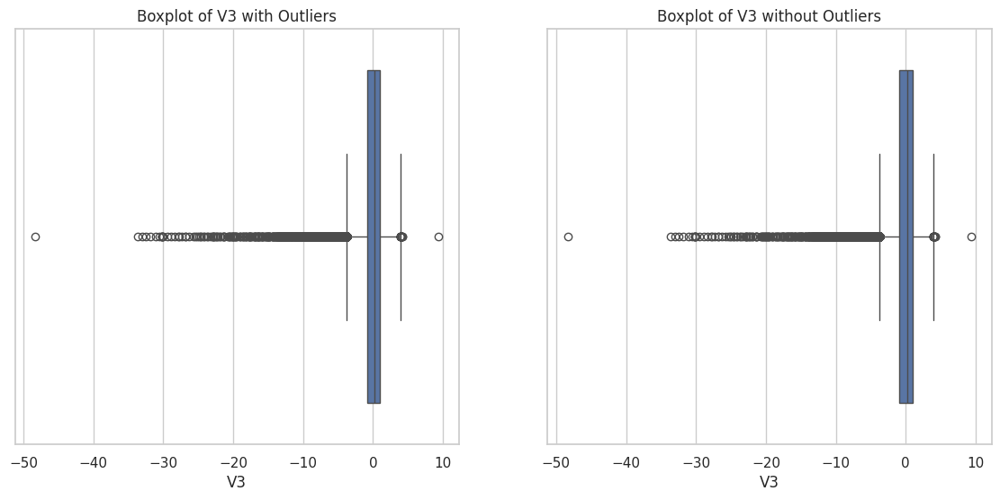

In [ ]:
# Original data
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x=data['V3'])
plt.title('Boxplot of V3 with Outliers')

# Data without outliers
df_no_outliers = data[~data.index.isin([1, 3])]
plt.subplot(1, 2, 2)
sns.boxplot(x=df_no_outliers['V3'])
plt.title('Boxplot of V3 without Outliers')

plt.show()

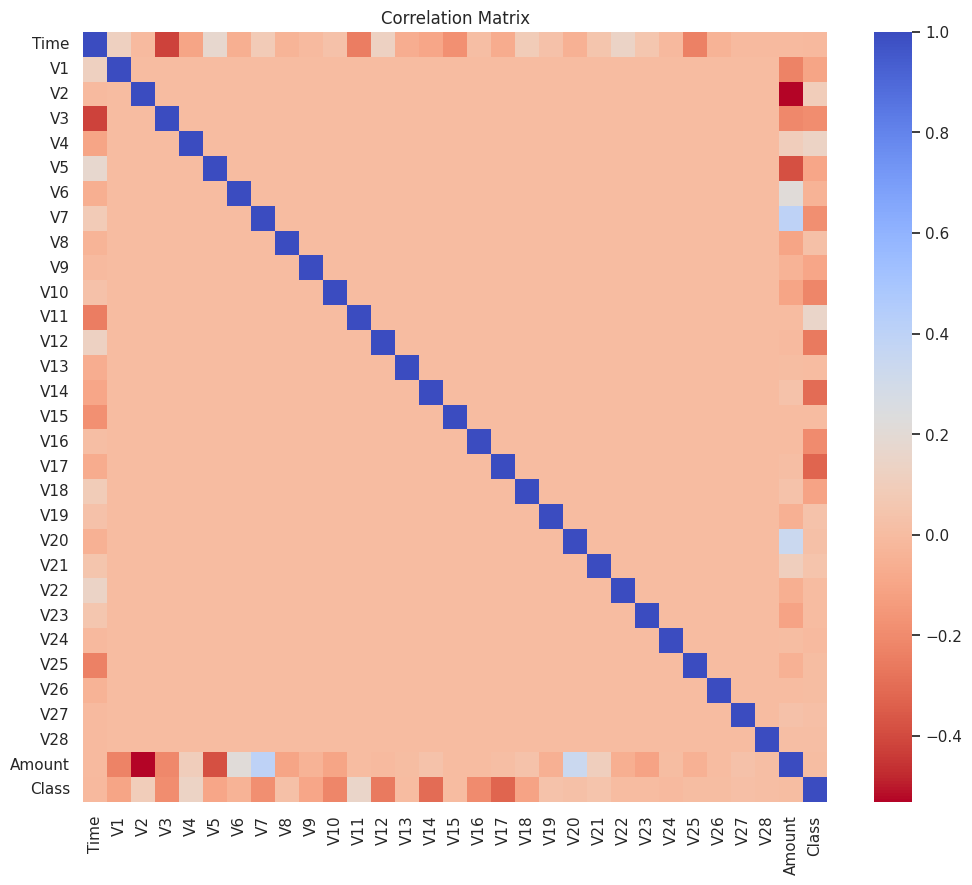

In [ ]:
# Correlation Matrix
plt.figure(figsize=(12,10))
corr = data.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':18})
plt.title('Correlation Matrix')
plt.show()

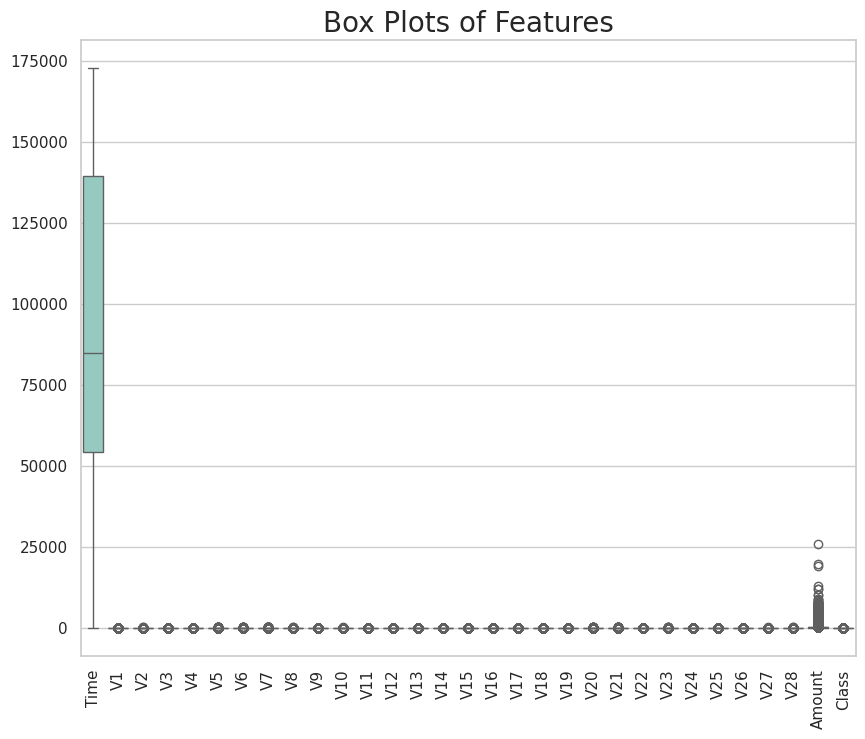

In [ ]:
#  Box plots
plt.figure(figsize=(10, 8))
sns.boxplot(data=data, palette="Set3")
plt.title('Box Plots of Features', fontsize=20)
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Install necessary package
!pip install imbalanced-learn


In [ ]:
from imblearn.over_sampling import SMOTE
# Calculate and print class imbalance ratio
imbalance_ratio = class_counts[0] / class_counts[1]
print(f'Class Imbalance Ratio (Not Fraud:Fraud) = {imbalance_ratio:.2f}:1')


Class Imbalance Ratio (Not Fraud:Fraud) = 577.88:1


In [ ]:
from sklearn.preprocessing import RobustScaler
# Data preprocessing
X = data.drop(columns=['Class'])
y = data['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Feature Scaling
scaler = RobustScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)
# Check the new class distribution
print(pd.Series(y_train_resampled).value_counts())

Class
0    227451
1    227451
Name: count, dtype: int64


In [ ]:
# The feature engineered data is now ready for model training
print("Feature Engineering Completed.")

Feature Engineering Completed.


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

# Initialize classifiers
rf_clf = RandomForestClassifier(random_state=42)
gb_clf = GradientBoostingClassifier(random_state=42)
xgb_clf = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')

In [ ]:
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train_scaled, y_train)


RandomForestClassifier(random_state=42)

In [ ]:
# Predict and evaluate
y_pred_rf = rf_clf.predict(X_test_scaled)
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_rf))


[[56862     2]
 [   23    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.97      0.77      0.86        98

    accuracy                           1.00     56962
   macro avg       0.99      0.88      0.93     56962
weighted avg       1.00      1.00      1.00     56962

ROC AUC Score: 0.8826354754056941


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
# Gradient Boosting
gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_clf.fit(X_train_scaled, y_train)

GradientBoostingClassifier(random_state=42)

In [ ]:
y_pred_gb = gb_clf.predict(X_test_scaled)
print("Gradient Boosting:")
print(confusion_matrix(y_test, y_pred_gb))
print(classification_report(y_test, y_pred_gb))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_gb))


Gradient Boosting:
[[56843    21]
 [   39    59]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.74      0.60      0.66        98

    accuracy                           1.00     56962
   macro avg       0.87      0.80      0.83     56962
weighted avg       1.00      1.00      1.00     56962

ROC AUC Score: 0.8008357570659101


In [ ]:
# XGBoost
xgb_clf = xgb.XGBClassifier(n_estimators=100, random_state=42)
xgb_clf.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=42, ...)

In [ ]:
y_pred_xgb = xgb_clf.predict(X_test_scaled)
print("XGBoost:")
print(confusion_matrix(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_xgb))

XGBoost:
[[56861     3]
 [   22    76]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.96      0.78      0.86        98

    accuracy                           1.00     56962
   macro avg       0.98      0.89      0.93     56962
weighted avg       1.00      1.00      1.00     56962

ROC AUC Score: 0.8877287233126226


In [ ]:
##Ensemble Creation
from sklearn.ensemble import StackingClassifier

# Create a stacking ensemble
estimators = [
    ('rf', rf_clf),
    ('gb', gb_clf),
    ('xgb', xgb_clf)
]

stacking_clf = StackingClassifier(estimators=estimators, final_estimator=RandomForestClassifier(random_state=42))
stacking_clf.fit(X_train_scaled, y_train)


StackingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),
                               ('gb',
                                GradientBoostingClassifier(random_state=42)),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_...
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=100, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=42, ...))],
                   final_estimator=RandomForestClassifier(random_state=42))

In [ ]:
# Evaluate Stacking Classifier
y_pred_stacking = stacking_clf.predict(X_test_scaled)

print("\nStacking Classifier:")
print("Accuracy:", accuracy_score(y_test, y_pred_stacking))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_stacking))
print("Classification Report:\n", classification_report(y_test, y_pred_stacking))
print("ROC AUC Score:", roc_auc_score(y_test, y_pred_stacking))



Stacking Classifier:
Accuracy: 0.9995435553526912
Confusion Matrix:
 [[56859     5]
 [   21    77]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.79      0.86        98

    accuracy                           1.00     56962
   macro avg       0.97      0.89      0.93     56962
weighted avg       1.00      1.00      1.00     56962

ROC AUC Score: 0.8928131783101535


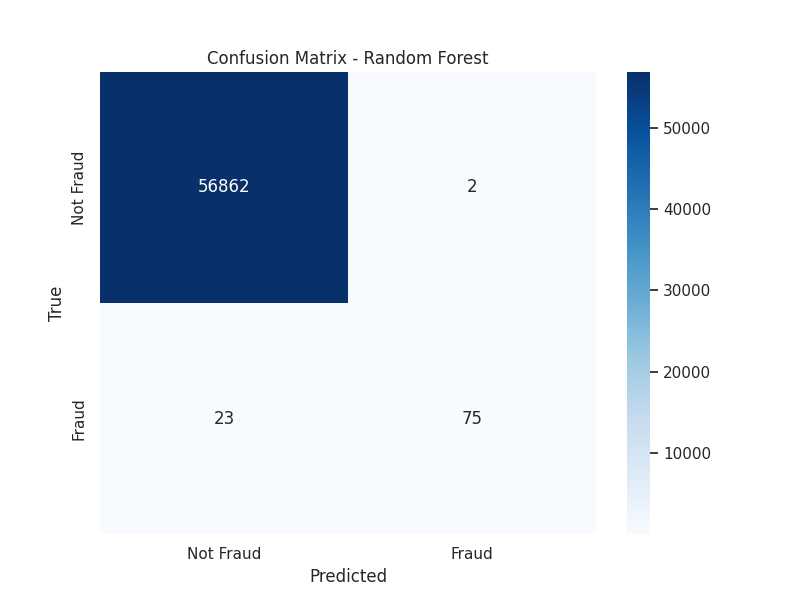

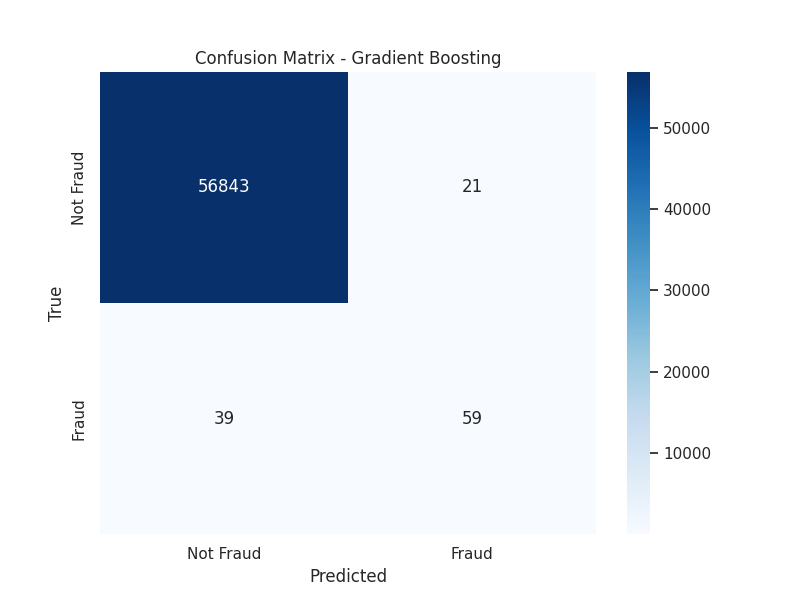

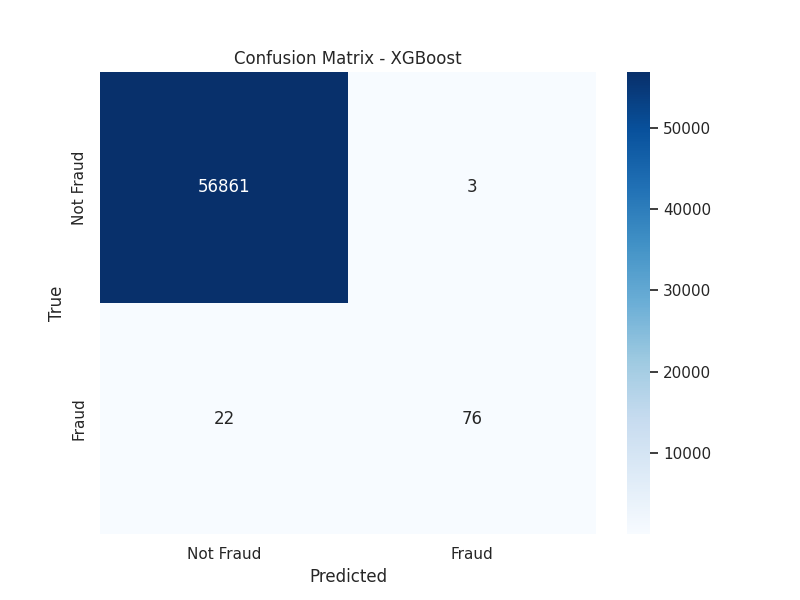

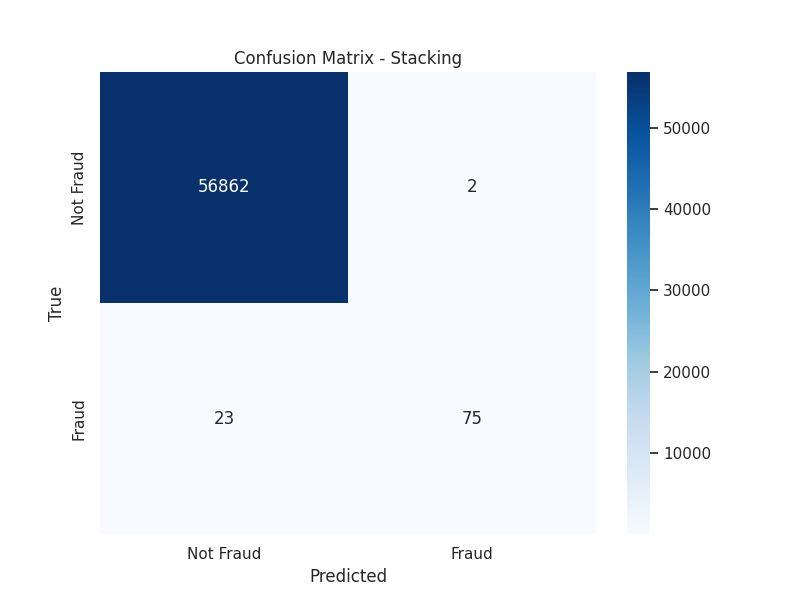

In [ ]:
# Function to plot confusion matrix
def plot_confusion_matrix(cm, labels, title, filename):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.savefig(filename)
    plt.close()# Models and their confusion matrices
models = {
    "Random Forest": [[56862, 2], [23, 75]],
    "Gradient Boosting": [[56843, 21], [39, 59]],
    "XGBoost": [[56861, 3], [22, 76]],
    "Stacking": [[56862, 2], [23, 75]]
}
# Iterate over models, plot confusion matrix, and save as image
for name, cm in models.items():
    plot_confusion_matrix(cm, labels=['Not Fraud', 'Fraud'], title=f'Confusion Matrix - {name}', filename=f'confusion_matrix_{name}.png')

from IPython.display import Image, display

# Display each confusion matrix image
for name in models.keys():
    display(Image(filename=f'confusion_matrix_{name}.png'))

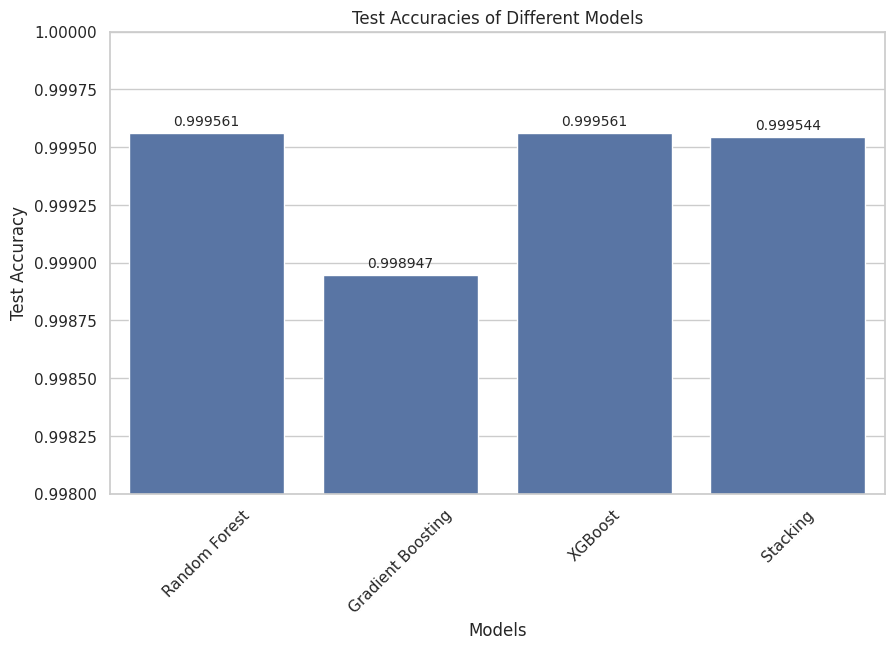

In [ ]:
# Test accuracies for each model
test_accuracies = {
    "Random Forest": 0.9995611109160493,
    "Gradient Boosting": 0.9989466661985184,
    "XGBoost": 0.9995611109160493,
    "Stacking": 0.9995435553526912
}

# Convert the dictionary to a format suitable for plotting
models = list(test_accuracies.keys())
accuracies = list(test_accuracies.values())

# Set up the matplotlib figure
plt.figure(figsize=(10, 6))

# Plot the accuracies
sns.barplot(x=models, y=accuracies)

# Add titles and labels
plt.title('Test Accuracies of Different Models')
plt.xlabel('Models')
plt.ylabel('Test Accuracy')
plt.ylim(0.998, 1.0)  # Adjust the y-axis for better visibility of differences
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add accuracy values on top of each bar
for i, accuracy in enumerate(accuracies):
    plt.text(i, accuracy + 0.00002, f'{accuracy:.6f}', ha='center', va='bottom', fontsize=10)

# Display the plot
plt.show()



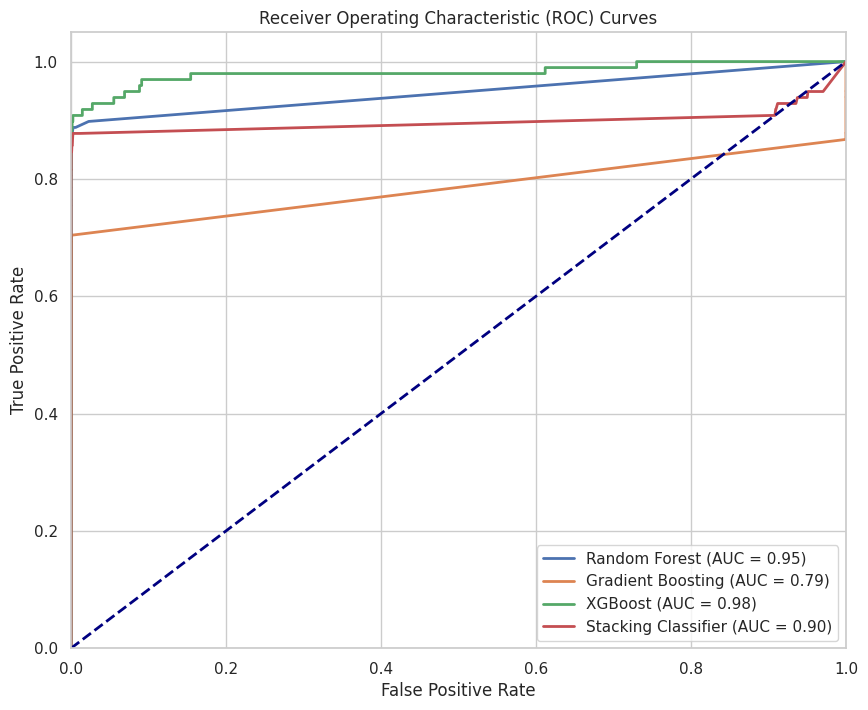

In [ ]:
from sklearn.metrics import roc_curve, auc

# Assuming y_test contains the true labels of the test set
y_true = y_test

# Dictionary to store the ROC curve data for each model
roc_data = {}

# List of model names and their corresponding fitted model objects
models = {
    "Random Forest": rf_clf,
    "Gradient Boosting": gb_clf,
    "XGBoost": xgb_clf,
    "Stacking Classifier": stacking_clf
}

# Compute ROC curve and ROC area for each model
for model_name, model in models.items():
    y_pred_prob = model.predict_proba(X_test_scaled)[:, 1]  # Probability estimates for the positive class
    fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    roc_data[model_name] = (fpr, tpr, roc_auc)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for model_name, (fpr, tpr, roc_auc) in roc_data.items():
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line (random classifier)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


In [ ]:
###Hyperparameter Tuning
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from xgboost import XGBClassifier
import time

# Use a smaller subset of data for quicker tuning
X_train_small, _, y_train_small, _ = train_test_split(X_train_scaled, y_train, train_size=0.1, random_state=42)

# Simplified parameter grids
rf_param_grid = {
    'n_estimators': [50],
    'max_depth': [10],
}

gb_param_grid = {
    'n_estimators': [50],
    'learning_rate': [0.1],
    'max_depth': [3]
}

xgb_param_grid = {
    'n_estimators': [50],
    'learning_rate': [0.1],
    'max_depth': [3],
    'subsample': [0.8]
}

# Initialize models
rf_random_search = RandomizedSearchCV(estimator=rf_clf, param_distributions=rf_param_grid,
                                      n_iter=5, scoring='accuracy', cv=2, n_jobs=-1, random_state=42)

gb_random_search = RandomizedSearchCV(estimator=gb_clf, param_distributions=gb_param_grid,
                                      n_iter=5, scoring='accuracy', cv=2, n_jobs=-1, random_state=42)

xgb_random_search = RandomizedSearchCV(estimator=XGBClassifier(), param_distributions=xgb_param_grid,
                                       n_iter=5, scoring='accuracy', cv=2, n_jobs=-1, random_state=42)

# Run RandomizedSearchCV for each model and measure the time taken
start_time = time.time()

rf_random_search.fit(X_train_small, y_train_small)
print("Best Parameters for Random Forest:", rf_random_search.best_params_)
best_rf_clf = rf_random_search.best_estimator_

gb_random_search.fit(X_train_small, y_train_small)
print("Best Parameters for Gradient Boosting:", gb_random_search.best_params_)
best_gb_clf = gb_random_search.best_estimator_

xgb_random_search.fit(X_train_small, y_train_small)
print("Best Parameters for XGBoost:", xgb_random_search.best_params_)
best_xgb_clf = xgb_random_search.best_estimator_

end_time = time.time()
total_time = (end_time - start_time) / 60  # Convert to minutes
print(f"Total time for hyperparameter tuning: {total_time:.2f} minutes")

best_xgb_clf_final = XGBClassifier(
    n_estimators=best_xgb_clf.get_params()['n_estimators'],
    learning_rate=best_xgb_clf.get_params()['learning_rate'],
    max_depth=best_xgb_clf.get_params()['max_depth'],
    subsample=best_xgb_clf.get_params()['subsample']
)


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 1 is smaller than n_iter=5. Running 1 iterations. For exhaustive searches, use GridSearchCV.

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



Best Parameters for Random Forest: {'n_estimators': 50, 'max_depth': 10}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 1 is smaller than n_iter=5. Running 1 iterations. For exhaustive searches, use GridSearchCV.



Best Parameters for Gradient Boosting: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.1}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 1 is smaller than n_iter=5. Running 1 iterations. For exhaustive searches, use GridSearchCV.



Best Parameters for XGBoost: {'subsample': 0.8, 'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.1}
Total time for hyperparameter tuning: 0.77 minutes


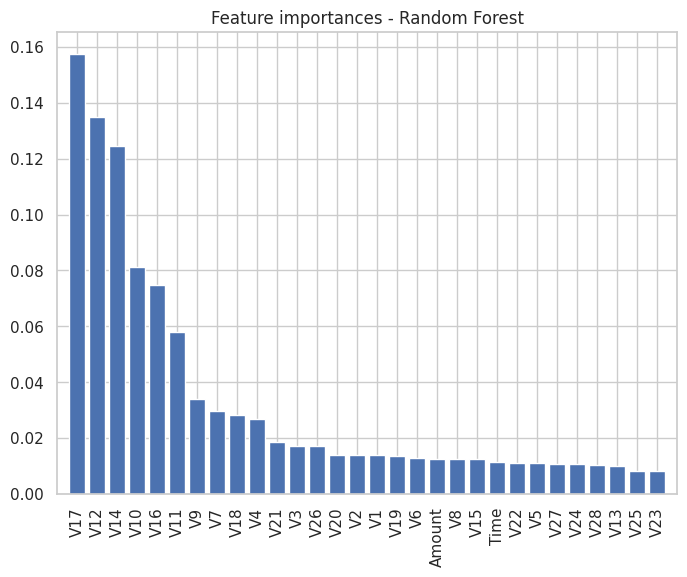

In [ ]:
# Feature importance for Random Forest
importances_rf = rf_clf.feature_importances_
indices_rf = np.argsort(importances_rf)[::-1]
# Plot feature importances
plt.figure(figsize=(8, 6))
plt.title("Feature importances - Random Forest")
plt.bar(range(X_train.shape[1]), importances_rf[indices_rf], align="center")
plt.xticks(range(X_train.shape[1]), X.columns[indices_rf], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

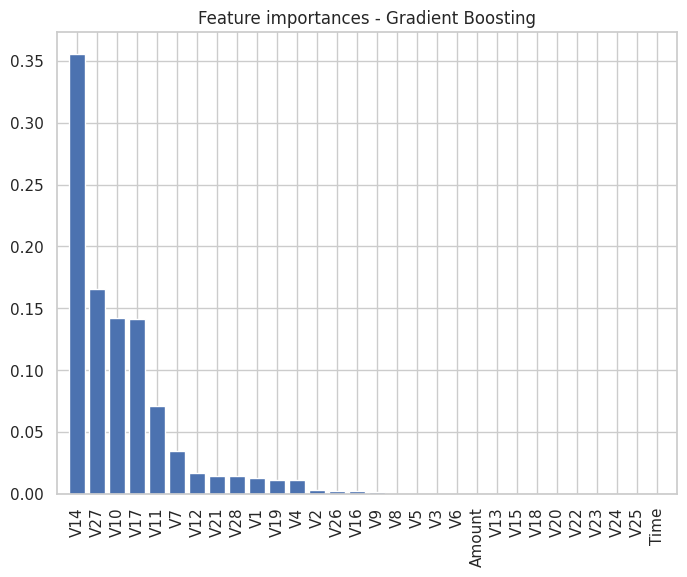

In [ ]:
# Gradient Boosting Feature Importance
importances_gb = gb_clf.feature_importances_
indices_gb = np.argsort(importances_gb)[::-1]

plt.figure(figsize=(8, 6))
plt.title("Feature importances - Gradient Boosting")
plt.bar(range(X_train.shape[1]), importances_gb[indices_gb], align="center")
plt.xticks(range(X_train.shape[1]), X.columns[indices_gb], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

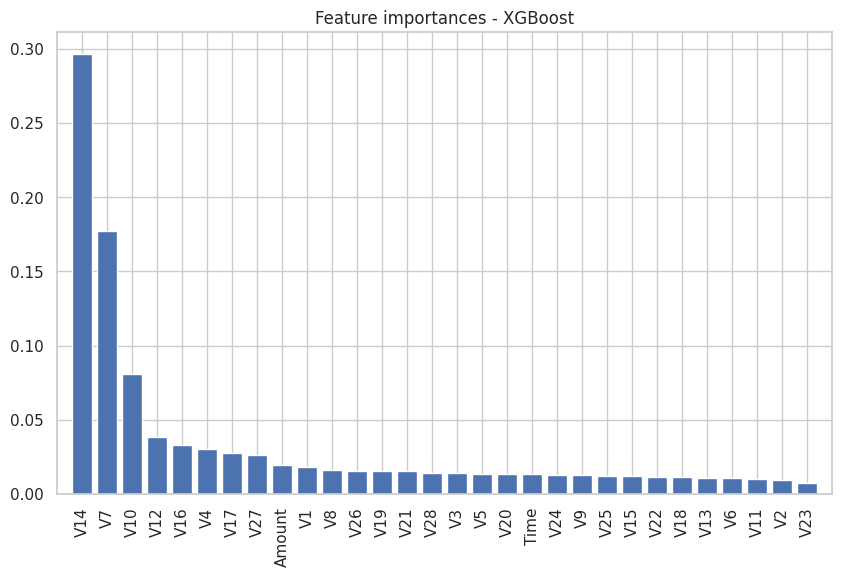

In [ ]:
# XGBoost Feature Importance
importances_xgb = xgb_clf.feature_importances_
indices_xgb = np.argsort(importances_xgb)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Feature importances - XGBoost")
plt.bar(range(X_train.shape[1]), importances_xgb[indices_xgb], align="center")
plt.xticks(range(X_train.shape[1]), X.columns[indices_xgb], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()

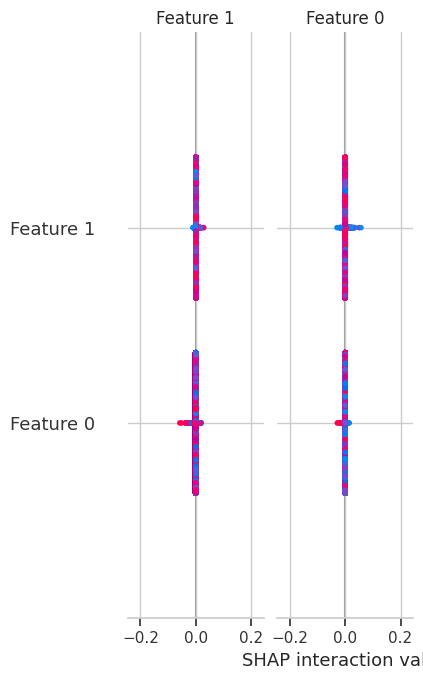

In [ ]:
##Explainable AI (XAI)
import shap

# Use SHAP to explain predictions
explainer = shap.TreeExplainer(best_rf_clf)
shap_values = explainer.shap_values(X_test_scaled)

# Summary plot for SHAP values
shap.summary_plot(shap_values, X_test_scaled)

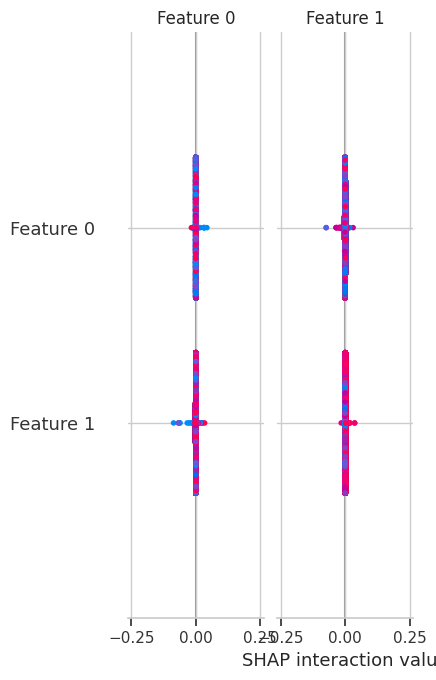

In [ ]:
# SHAP for Random Forest
explainer_rf = shap.TreeExplainer(rf_clf)
shap_values_rf = explainer_rf.shap_values(X_test_scaled)
shap.summary_plot(shap_values_rf, X_test_scaled, plot_type="bar")

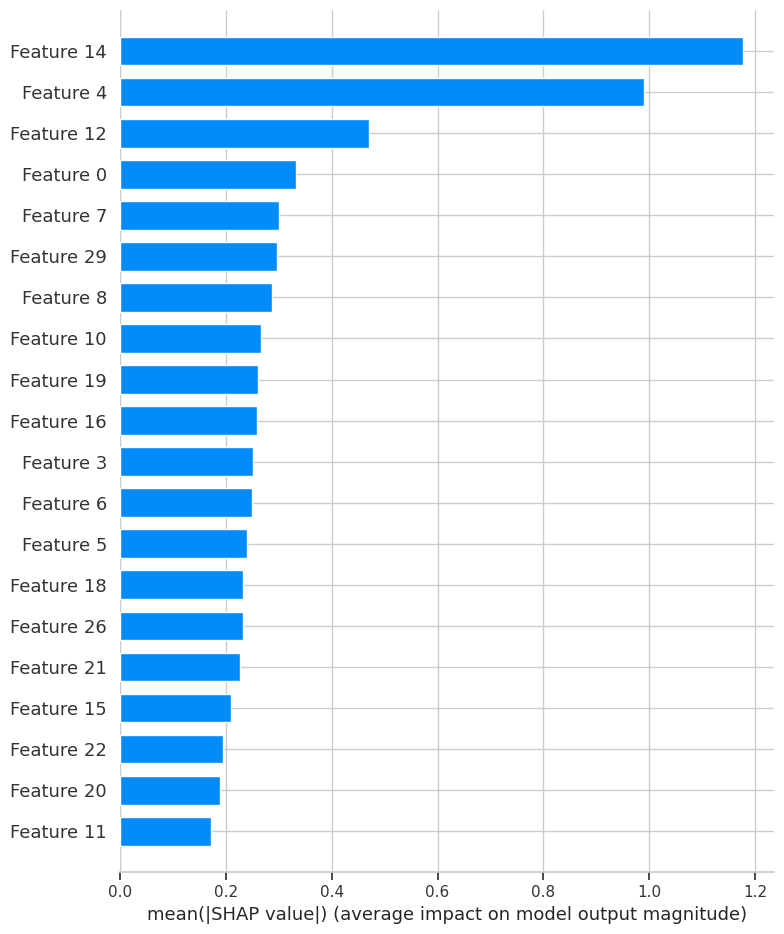

In [ ]:
# SHAP for XGBoost
explainer_xgb = shap.TreeExplainer(xgb_clf)
shap_values_xgb = explainer_xgb.shap_values(X_test_scaled)
shap.summary_plot(shap_values_xgb, X_test_scaled, plot_type="bar")


In [ ]:
pip install lime


In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# LIME for a single instance (example index 0)
explainer_lime = LimeTabularExplainer(X_train_scaled,
                                      feature_names=data.columns[:-1],
                                      class_names=['Not Fraud', 'Fraud'],
                                      discretize_continuous=True)

# Explain instance from X_test
i = 0  # example instance index
exp = explainer_lime.explain_instance(X_test_scaled[i], model.predict_proba)
exp.show_in_notebook(show_table=True)


In [ ]:
exp = explainer_lime.explain_instance(X_test_scaled[i], rf_clf.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)


In [ ]:
exp = explainer_lime.explain_instance(X_test_scaled[i], gb_clf.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)


In [ ]:
exp = explainer_lime.explain_instance(X_test_scaled[i], xgb_clf.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)

In [ ]:
exp = explainer_lime.explain_instance(X_test_scaled[i], stacking_clf.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)